# Medical Notes NLP Challenge（Huang Jingfang）
**Task:** The goal of this challenge is to propose different approaches to generate vector representations of texts (tokens) and assess and compare the suitability of the approach for this dataset.   

**Dataset:** This is a project that aims to extract information about patient's condition from visit notes collected in the real-world setting. In order to extract all the information, the first step is to figure out how to generate vector representations of the texts in a way that can capture the clinical meanings.The notes contain a variety of information including _demographics_, _diagnosis_, _medical history_, _medication/treatments_, etc.   


>1.	A list of related medical entities pairs _**“MedicalConcepts.csv”**_ contains a list of related medical entities pairs (Term1 and Term2 are related to each other) that has been curated by domain experts
>2.	Sample notes collected from patient visits _**“ClinNotes.csv”**_ contains notes (column=’notes’) from three departments (column=’category’), i.e. Cardiovascular / Pulmonary, Neurology, and Gastroenterology


Approach:
>* Understand the two datasets given  
>* Apply different ways of tokenization and compare the results
>* Apply different ways to generate vector representations of texts  
>* Assess and compare different approaches 

---

## Essential Libraries

Let us begin by importing the essential Python Libraries.

In [18]:
# Basic Libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import string

## Import the Dataset   
Firstly, check the information of both datasets(MedicalConcepts and ClinNotes).

In [19]:
#Medical Concepts
Med = pd.read_csv('MedicalConcepts.csv')
Med.head()

,Term1,Term2
0,Glaucoma,Fibrillation
1,Carbatrol,Dilantin
2,Cardiomyopathy,Tylenol
3,Herpes,Hyperthyroidism
4,Seasickness,Nausea


In [20]:
#Clinical Notes
Notes = pd.read_csv('ClinNotes.csv')
Notes.head()

,category,notes
0,Cardiovascular / Pulmonary,"2-D M-MODE: , ,1. Left atrial enlargement wit..."
1,Cardiovascular / Pulmonary,1. The left ventricular cavity size and wall ...
2,Cardiovascular / Pulmonary,"2-D ECHOCARDIOGRAM,Multiple views of the heart..."
3,Cardiovascular / Pulmonary,"DESCRIPTION:,1. Normal cardiac chambers size...."
4,Cardiovascular / Pulmonary,"2-D STUDY,1. Mild aortic stenosis, widely calc..."


## Data Visualization

In [21]:
#Separate clinical notes into 3 categories
Cardio = Notes.loc[Notes['category']== 'Cardiovascular / Pulmonary']
Neuro = Notes.loc[Notes['category'] == 'Neurology']
Gastro = Notes.loc[Notes['category']== 'Gastroenterology']

In [22]:
Notes.groupby('category').describe()

notes         \
                           count unique   
category                                  
Cardiovascular / Pulmonary   371    371   
Gastroenterology             224    224   
Neurology                    223    223   

                                                                               \
                                                                          top   
category                                                                        
Cardiovascular / Pulmonary  PREOPERATIVE DIAGNOSES:,1.  Chronic renal fail...   
Gastroenterology            PREOPERATIVE DIAGNOSIS: , Biliary colic and bi...   
Neurology                   She also had EMG/nerve conduction studies sinc...   

                                 
                           freq  
category                         
Cardiovascular / Pulmonary    1  
Gastroenterology              1  
Neurology                     1

In [23]:
# Attach a new column 'length' 
Notes['length'] = Notes['notes'].apply(len)
Notes.head(10)

,category,notes,length
0,Cardiovascular / Pulmonary,"2-D M-MODE: , ,1. Left atrial enlargement wit...",495
1,Cardiovascular / Pulmonary,1. The left ventricular cavity size and wall ...,1618
2,Cardiovascular / Pulmonary,"2-D ECHOCARDIOGRAM,Multiple views of the heart...",759
3,Cardiovascular / Pulmonary,"DESCRIPTION:,1. Normal cardiac chambers size....",495
4,Cardiovascular / Pulmonary,"2-D STUDY,1. Mild aortic stenosis, widely calc...",662
5,Neurology,"CC:, Confusion and slurred speech.,HX , (prima...",3509
6,Cardiovascular / Pulmonary,"PREOPERATIVE DIAGNOSES,Airway obstruction seco...",5749
7,Neurology,"PROCEDURE: , EEG during wakefulness demonstrat...",1127
8,Neurology,"Doctor's Address,Dear Doctor:,This letter is a...",2516
9,Neurology,"TIME SEEN: , 0734 hours and 1034 hours.,TOTAL ...",1088


In [24]:
%matplotlib inline

<AxesSubplot:ylabel='Frequency'>

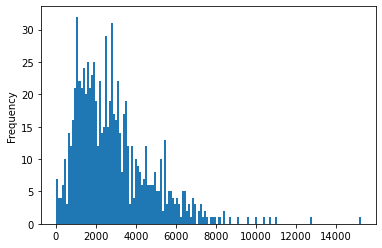

In [25]:
Notes['length'].plot.hist(bins=150)

array([[<AxesSubplot:title={'center':'Cardiovascular / Pulmonary'}>,
        <AxesSubplot:title={'center':'Gastroenterology'}>],
       [<AxesSubplot:title={'center':'Neurology'}>, <AxesSubplot:>]],
      dtype=object)

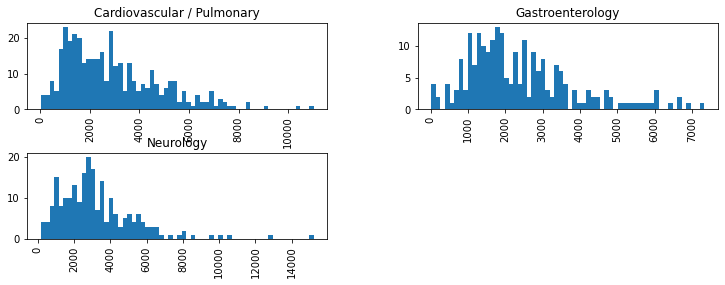

In [26]:
Notes.hist(column = 'length',by='category',bins=60,figsize=(12,4))

## Tokenization

### a. Sentence tokenization with split ('.')

In [27]:
for records in Notes['notes']:
    tokens = records.split('.')
    print(tokens)

['2-D M-MODE: , ,1', '  Left atrial enlargement with left atrial diameter of 4', '7 cm', ',2', '  Normal size right and left ventricle', ',3', '  Normal LV systolic function with left ventricular ejection fraction of 51%', ',4', '  Normal LV diastolic function', ',5', '  No pericardial effusion', ',6', '  Normal morphology of aortic valve, mitral valve, tricuspid valve, and pulmonary valve', ',7', '  PA systolic pressure is 36 mmHg', ',DOPPLER: , ,1', '  Mild mitral and tricuspid regurgitation', ',2', '  Trace aortic and pulmonary regurgitation', '']
['1', '  The left ventricular cavity size and wall thickness appear normal', '  The wall motion and left ventricular systolic function appears hyperdynamic with estimated ejection fraction of 70% to 75%', '  There is near-cavity obliteration seen', '  There also appears to be increased left ventricular outflow tract gradient at the mid cavity level consistent with hyperdynamic left ventricular systolic function', '  There is abnormal left 

The output is not satisfactory because '.' is used in the notes for multiple functions, such as after each bullet point.

### b. NLTK

In [12]:
#word_tokenizer
from nltk.tokenize import word_tokenize
for records in Notes['notes']:
    nltktokens = word_tokenize(records)
    print(nltktokens)

['2-D', 'M-MODE', ':', ',', ',1', '.', 'Left', 'atrial', 'enlargement', 'with', 'left', 'atrial', 'diameter', 'of', '4.7', 'cm.,2', '.', 'Normal', 'size', 'right', 'and', 'left', 'ventricle.,3', '.', 'Normal', 'LV', 'systolic', 'function', 'with', 'left', 'ventricular', 'ejection', 'fraction', 'of', '51', '%', '.,4', '.', 'Normal', 'LV', 'diastolic', 'function.,5', '.', 'No', 'pericardial', 'effusion.,6', '.', 'Normal', 'morphology', 'of', 'aortic', 'valve', ',', 'mitral', 'valve', ',', 'tricuspid', 'valve', ',', 'and', 'pulmonary', 'valve.,7', '.', 'PA', 'systolic', 'pressure', 'is', '36', 'mmHg.', ',', 'DOPPLER', ':', ',', ',1', '.', 'Mild', 'mitral', 'and', 'tricuspid', 'regurgitation.,2', '.', 'Trace', 'aortic', 'and', 'pulmonary', 'regurgitation', '.']
['1', '.', 'The', 'left', 'ventricular', 'cavity', 'size', 'and', 'wall', 'thickness', 'appear', 'normal', '.', 'The', 'wall', 'motion', 'and', 'left', 'ventricular', 'systolic', 'function', 'appears', 'hyperdynamic', 'with', 'estim

['REASON', 'FOR', 'VISIT', ':', ',', 'The', 'patient', 'is', 'an', '11-month-old', 'with', 'a', 'diagnosis', 'of', 'stage', '2', 'neuroblastoma', 'here', 'for', 'ongoing', 'management', 'of', 'his', 'disease', 'and', 'the', 'visit', 'is', 'supervised', 'by', 'Dr.', 'X.', ',', 'HISTORY', 'OF', 'PRESENT', 'ILLNESS', ':', ',', 'The', 'patient', 'is', 'an', '11-month-old', 'with', 'neuroblastoma', ',', 'which', 'initially', 'presented', 'on', 'the', 'left', 'when', 'he', 'was', '6', 'weeks', 'old', 'and', 'was', 'completely', 'resected', '.', 'It', 'was', 'felt', 'to', 'be', 'stage', '2', '.', 'It', 'was', 'not', 'N-Myc', 'amplified', 'and', 'had', 'favorable', 'Shimada', 'histology', '.', 'In', 'followup', ',', 'he', 'was', 'found', 'to', 'have', 'a', 'second', 'primary', 'in', 'his', 'right', 'adrenal', 'gland', ',', 'which', 'was', 'biopsied', 'and', 'also', 'consistent', 'with', 'neuroblastoma', 'with', 'favorable', 'Shimada', 'histology', '.', 'He', 'is', 'now', 'being', 'treated', 'w

['REASON', 'FOR', 'VISIT', ':', ',', 'This', 'is', 'an', '83-year-old', 'woman', 'referred', 'for', 'diagnostic', 'lumbar', 'puncture', 'for', 'possible', 'malignancy', 'by', 'Dr.', 'X', '.', 'She', 'is', 'accompanied', 'by', 'her', 'daughter.', ',', 'HISTORY', 'OF', 'PRESENT', 'ILLNESS', ':', ',', 'The', 'patient', "'", 'daughter', 'tells', 'me', 'that', 'over', 'the', 'last', 'month', 'the', 'patient', 'has', 'gradually', 'stopped', 'walking', 'even', 'with', 'her', 'walker', 'and', 'her', 'left', 'arm', 'has', 'become', 'gradually', 'less', 'functional', '.', 'She', 'is', 'not', 'able', 'to', 'use', 'the', 'walker', 'because', 'her', 'left', 'arm', 'is', 'so', 'weak', '.', 'She', 'has', 'not', 'been', 'having', 'any', 'headaches', '.', 'She', 'has', 'had', 'a', 'significant', 'decrease', 'in', 'appetite', '.', 'She', 'is', 'known', 'to', 'have', 'lung', 'cancer', ',', 'but', 'Ms.', 'Wilson', 'does', 'not', 'know', 'what', 'kind', '.', 'According', 'to', 'her', 'followup', 'notes', '

['CC', ':', ',', 'Episodic', 'mental', 'status', 'change', 'and', 'RUE', 'numbness', ',', 'and', 'chorea', '(', 'found', 'on', 'exam', ')', '.', ',', 'HX', ':', ',', 'This', '78y/o', 'RHM', 'was', 'referred', 'for', 'an', 'episode', 'of', 'unusual', 'behavior', 'and', 'RUE', 'numbness', '.', 'In', '9/91', ',', 'he', 'experienced', 'near', 'loss', 'of', 'consciousness', ',', 'generalized', 'weakness', ',', 'headache', 'and', 'vomiting', '.', 'Evaluation', 'at', 'that', 'time', 'revealed', 'an', 'serum', 'glucose', 'of', '>', '500mg/dL', 'and', 'he', 'was', 'placed', 'on', 'insulin', 'therapy', 'with', 'subsequent', 'resolution', 'of', 'his', 'signs', 'and', 'symptoms', '.', 'Since', 'then', ',', 'he', 'became', 'progressively', 'more', 'forgetful', ',', 'and', 'at', 'the', 'time', 'of', 'evaluation', ',', '1/17/93', ',', 'had', 'lost', 'his', 'ability', 'to', 'perform', 'his', 'job', 'repairing', 'lawn', 'mowers', '.', 'His', 'wife', 'had', 'taken', 'over', 'the', 'family', 'finances.',

['PREOPERATIVE', 'DIAGNOSES', ':', ',1', '.', 'Squamous', 'cell', 'carcinoma', 'of', 'the', 'head', 'and', 'neck.,2', '.', 'Ethanol', 'and', 'alcohol', 'abuse.', ',', 'POSTOPERATIVE', 'DIAGNOSES', ':', ',1', '.', 'Squamous', 'cell', 'carcinoma', 'of', 'the', 'head', 'and', 'neck.,2', '.', 'Ethanol', 'and', 'alcohol', 'abuse.', ',', 'PROCEDURE', ':', ',1', '.', 'Failed', 'percutaneous', 'endoscopic', 'gastrostomy', 'tube', 'placement.,2', '.', 'Open', 'Stamm', 'gastrotomy', 'tube.,3', '.', 'Lysis', 'of', 'adhesions.,4', '.', 'Closure', 'of', 'incidental', 'colotomy.', ',', 'ANESTHESIA', ':', ',', 'General', 'endotracheal', 'anesthesia.', ',', 'IV', 'FLUIDS', ':', ',', 'Crystalloid', '1400', 'ml.', ',', 'ESTIMATED', 'BLOOD', 'LOSS', ':', ',', 'Thirty', 'ml.', ',', 'DRAINS', ':', ',', 'Gastrostomy', 'tube', 'was', 'placed', 'to', 'Foley.', ',', 'SPECIMENS', ':', ',', 'None.', ',', 'FINDINGS', ':', ',', 'Stomach', 'located', 'high', 'in', 'the', 'peritoneal', 'cavity', '.', 'Multiple', 'ad

['PREOPERATIVE', 'DIAGNOSES', ':', ',1', '.', 'Gastroesophageal', 'reflux', 'disease.,2', '.', 'Chronic', 'dyspepsia.', ',', 'POSTOPERATIVE', 'DIAGNOSES', ':', ',1', '.', 'Gastroesophageal', 'reflux', 'disease.,2', '.', 'Chronic', 'dyspepsia.,3', '.', 'Alkaline', 'reflux', 'gastritis.,4', '.', 'Gastroparesis.,5', '.', 'Probable', 'Billroth', 'II', 'anastomosis.,6', '.', 'Status', 'post', 'Whipple', "'s", 'pancreaticoduodenectomy.', ',', 'PROCEDURE', 'PERFORMED', ':', ',', 'Esophagogastroduodenoscopy', 'with', 'biopsies.', ',', 'INDICATIONS', 'FOR', 'PROCEDURE', ':', ',', 'This', 'is', 'a', '55-year-old', 'African-American', 'female', 'who', 'had', 'undergone', 'Whipple', "'s", 'procedure', 'approximately', 'five', 'to', 'six', 'years', 'ago', 'for', 'a', 'benign', 'pancreatic', 'mass', '.', 'The', 'patient', 'has', 'pancreatic', 'insufficiency', 'and', 'is', 'already', 'on', 'replacement', '.', 'She', 'is', 'currently', 'using', 'Nexium', '.', 'She', 'has', 'continued', 'postprandial',

['CURRENT', 'MEDICATIONS', ':', ',', 'Lortab.', ',', 'PREVIOUS', 'MEDICAL', 'HISTORY', ':', ',', 'Cardiac', 'stent', 'in', '2000.', ',', 'PATIENT', "'S", 'GOAL', ':', ',', 'To', 'eat', 'again', 'by', 'mouth.', ',', 'STUDY', ':', ',', 'A', 'trial', 'of', 'Passy-Muir', 'valve', 'was', 'completed', 'to', 'allow', 'the', 'patient', 'to', 'achieve', 'hands-free', 'voicing', 'and', 'also', 'to', 'improve', 'his', 'secretion', 'management', '.', 'A', 'clinical', 'swallow', 'evaluation', 'was', 'not', 'completed', 'due', 'to', 'the', 'severity', 'of', 'the', 'patient', "'s", 'mucus', 'and', 'lack', 'of', 'saliva', 'control.', ',', 'The', 'patient', "'s", 'laryngeal', 'area', 'was', 'palpated', 'during', 'a', 'dry', 'swallow', 'and', 'he', 'does', 'have', 'significantly', 'reduced', 'laryngeal', 'elevation', 'and', 'radiation', 'fibrosis', '.', 'The', 'further', 'evaluate', 'of', 'his', 'swallowing', 'function', 'is', 'safety', ';', 'a', 'modified', 'barium', 'swallow', 'study', 'needs', 'to', 

['REASON', 'FOR', 'CONSULTATION', ':', ',', 'Pericardial', 'effusion.', ',', 'HISTORY', 'OF', 'PRESENT', 'ILLNESS', ':', ',', 'The', 'patient', 'is', 'an', '84-year-old', 'female', 'presented', 'to', 'emergency', 'room', 'with', 'shortness', 'of', 'breath', ',', 'fatigue', ',', 'and', 'tiredness', '.', 'Low-grade', 'fever', 'was', 'noted', 'last', 'few', 'weeks', '.', 'The', 'patient', 'also', 'has', 'chest', 'pain', 'described', 'as', 'dull', 'aching', 'type', 'in', 'precordial', 'region', '.', 'No', 'relation', 'to', 'exertion', 'or', 'activity', '.', 'No', 'aggravating', 'or', 'relieving', 'factors', '.', 'A', 'CT', 'of', 'the', 'chest', 'was', 'done', ',', 'which', 'shows', 'pericardial', 'effusion', '.', 'This', 'consultation', 'is', 'for', 'the', 'same', '.', 'The', 'patient', 'denies', 'any', 'lightheadedness', 'or', 'dizziness', '.', 'No', 'presyncope', 'or', 'syncope', '.', 'Activity', 'is', 'fairly', 'stable.', ',', 'CORONARY', 'RISK', 'FACTORS', ':', ',', 'History', 'of', 'b

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Not very useful if directly use word_tokenize because every signle word and punctuation will be splitted.

In [13]:
#sentence_tokenizer
from nltk.tokenize import sent_tokenize
for records in Notes['notes']:
    sentences = sent_tokenize(records)
    print(sentences)

['2-D M-MODE: , ,1.', 'Left atrial enlargement with left atrial diameter of 4.7 cm.,2.', 'Normal size right and left ventricle.,3.', 'Normal LV systolic function with left ventricular ejection fraction of 51%.,4.', 'Normal LV diastolic function.,5.', 'No pericardial effusion.,6.', 'Normal morphology of aortic valve, mitral valve, tricuspid valve, and pulmonary valve.,7.', 'PA systolic pressure is 36 mmHg.,DOPPLER: , ,1.', 'Mild mitral and tricuspid regurgitation.,2.', 'Trace aortic and pulmonary regurgitation.']
['1.', 'The left ventricular cavity size and wall thickness appear normal.', 'The wall motion and left ventricular systolic function appears hyperdynamic with estimated ejection fraction of 70% to 75%.', 'There is near-cavity obliteration seen.', 'There also appears to be increased left ventricular outflow tract gradient at the mid cavity level consistent with hyperdynamic left ventricular systolic function.', 'There is abnormal left ventricular relaxation pattern seen as well 

['REASON FOR NEUROLOGICAL CONSULTATION: , Cervical spondylosis and kyphotic deformity.', 'The patient was seen in conjunction with medical resident Dr. X. I personally obtained the history, performed examination, and generated the impression and plan.,HISTORY OF PRESENT ILLNESS: ,The patient is a 45-year-old African-American female whose symptoms first started some one and a half years ago with pain in the left shoulder and some neck pain.', 'This has subsequently resolved.', 'She started vigorous workouts in November 2005.', 'In March of this year, she suddenly could not feel her right foot on the bathroom floor and subsequently went to her primary care physician.', 'By her report, she had a nerve conduction study and a diagnosis of radiculopathy was made.', 'She had an MRI of lumbosacral spine, which was within normal limits.', 'She then developed a tingling sensation in the right middle toe.', 'Symptoms progressed to sensory symptoms of her knees, elbows, and left middle toe.', 'She

["CHIEF COMPLAINT: , Dysphagia and hematemesis while vomiting.,HISTORY OF PRESENT ILLNESS: , This is a 53-year-old African American female with 15 years known history of HIV and hepatitis B, and known history of compensated heart failure, COPD, who presented today with complaint of stuck food in her esophagus, bloody cough, and bloody vomiting since 4 o'clock this vomiting, when she ate eggplant parmigiana meal.", 'The back and chest pain is 8/10, no radiation and is constant.', 'She denied fever, abdominal pain, or dysphagia before current event eating bones or fish.', 'This is the first episode of hematemesis and feeling of globus pallidus.', 'In the emergency room, the patient was treated with nitropaste, morphine, and Lopressor with positive results for chest pain.', 'CAT scan of the chest showed diffuse esophageal dilatation with residual food in it, no mediastinal air was identified.,REVIEW OF SYSTEMS: , The patient denied diarrhea, abdominal pain, fever, weight loss, dysphagia b

['CHIEF COMPLAINT: , Newly diagnosed high-risk acute lymphoblastic leukemia; extensive deep vein thrombosis, right iliac vein and inferior vena cava (IVC), status post balloon angioplasty, and mechanical and pharmacologic thrombolysis following placement of a vena caval filter.,HISTORY OF PRESENT ILLNESS: , The patient was transferred here the evening of 02/23/2007 from Hospital with a new diagnosis of high-risk acute lymphoblastic leukemia based on confirmation by flow cytometry of peripheral blood lymphoblasts that afternoon.', 'History related to this illness probably dates back to October of 2006 when he had onset of swelling and discomfort in the left testicle with what he described as a residual "lump" posteriorly.', 'The left testicle has continued to be painful off and on since.', 'In early November, he developed pain in the posterior part of his upper right leg, which he initially thought was related to skateboarding and muscle strain.', 'Physical therapy was prescribed and th

['PRECATHETERIZATION DIAGNOSIS (ES):, Hypoplastic left heart, status post Norwood procedure and Glenn shunt.,POSTCATHETERIZATION DIAGNOSIS (ES):,1.', 'Hypoplastic left heart.,A.', 'Status post Norwood.,B.', 'Status post Glenn.,2.', 'Left pulmonary artery hypoplasia.,3.', 'Diminished right ventricular systolic function.,4.', 'Trivial neo-aortic stenosis.,5.', 'Trivial coarctation.,6.', 'Flow to right upper lobe more than left upper lobe from collaterals arising from branches of the aortic arch.,PROCEDURE (S):, Right heart and left heart catheterization by way of right femoral artery, right femoral vein, and right internal jugular vein.,I.', 'PROCEDURES:, XXXXXX was brought to the catheterization lab and was anesthetized by anesthesia.', 'He was intubated.', 'His supplemental oxygen was weaned to 24%, on which all of his hemodynamics were obtained.', 'The patient was prepped and draped in the routine sterile fashion, including both groins and the right neck.', 'Xylocaine was administered

### c. Sentence Tokenization using Regular Expressions

In [28]:
import re
for records in Notes['notes']:
    sentences = re.compile('[:.!?] ').split(records)
sentences

['REASON FOR CONSULTATION',
 ' ,Abnormal echocardiogram findings and followup',
 ' Shortness of breath, congestive heart failure, and valvular insufficiency.,HISTORY OF PRESENT ILLNESS',
 ' ,The patient is an 86-year-old female admitted for evaluation of abdominal pain and bloody stools',
 ' The patient has colitis and also diverticulitis, undergoing treatment',
 ' During the hospitalization, the patient complains of shortness of breath, which is worsening',
 ' The patient underwent an echocardiogram, which shows severe mitral regurgitation and also large pleural effusion',
 ' This consultation is for further evaluation in this regard',
 ' As per the patient, she is an 86-year-old female, has limited activity level',
 ' She has been having shortness of breath for many years',
 ' She also was told that she has a heart murmur, which was not followed through on a regular basis.,CORONARY RISK FACTORS',
 ', History of hypertension, no history of diabetes mellitus, nonsmoker, cholesterol sta

## Simple Text Processing     

By using the stopwords package from NLTK. 

In [15]:
from nltk.corpus import stopwords

In [16]:
def text_process(mess):
    """
    1. remove punctuation
    2. remove stop words
    3. return list of clean text words
    """
    
    nopunc = [char for char in mess if char not in string.punctuation]
    
    nopunc = ''.join(nopunc)
    
    return [word for word in nopunc.split() if word.lower() not in stopwords.words('english')]

In [18]:
Notes['notes'].head(5).apply(text_process)

0    [2D, MMODE, 1, Left, atrial, enlargement, left...
1    [1, left, ventricular, cavity, size, wall, thi...
2    [2D, ECHOCARDIOGRAMMultiple, views, heart, gre...
3    [DESCRIPTION1, Normal, cardiac, chambers, size...
4    [2D, STUDY1, Mild, aortic, stenosis, widely, c...
Name: notes, dtype: object

## Bag-of-words Model

To vectorize a corpus with a bag-of-words (BOW) approach, I represent every document from the corpus as a vector whose length is equal to the vocabulary of the corpus, and arrive at a vector mapping of the corpus that enables unique representation of every document.

In [19]:
from sklearn.feature_extraction.text import CountVectorizer

In [20]:
#use CountVectorizer to convert a collection of text documents to a matrix of token counts
bow_transformer = CountVectorizer(analyzer = text_process).fit(Notes['notes'])

In [21]:
#Number of Vocabulary
print(len(bow_transformer.vocabulary_))

25683


In [22]:
#Check a single record - note2
note2 = Notes['notes'][1]
print(note2)

1.  The left ventricular cavity size and wall thickness appear normal.  The wall motion and left ventricular systolic function appears hyperdynamic with estimated ejection fraction of 70% to 75%.  There is near-cavity obliteration seen.  There also appears to be increased left ventricular outflow tract gradient at the mid cavity level consistent with hyperdynamic left ventricular systolic function.  There is abnormal left ventricular relaxation pattern seen as well as elevated left atrial pressures seen by Doppler examination.,2.  The left atrium appears mildly dilated.,3.  The right atrium and right ventricle appear normal.,4.  The aortic root appears normal.,5.  The aortic valve appears calcified with mild aortic valve stenosis, calculated aortic valve area is 1.3 cm square with a maximum instantaneous gradient of 34 and a mean gradient of 19 mm.,6.  There is mitral annular calcification extending to leaflets and supportive structures with thickening of mitral valve leaflets with mil

In [23]:
#Check a single record - note3
note3 = Notes['notes'][2]
print(note3)

2-D ECHOCARDIOGRAM,Multiple views of the heart and great vessels reveal normal intracardiac and great vessel relationships.  Cardiac function is normal.  There is no significant chamber enlargement or hypertrophy.  There is no pericardial effusion or vegetations seen.  Doppler interrogation, including color flow imaging, reveals systemic venous return to the right atrium with normal tricuspid inflow.  Pulmonary outflow is normal at the valve.  Pulmonary venous return is to the left atrium.  The interatrial septum is intact.  Mitral inflow and ascending aorta flow are normal.  The aortic valve is trileaflet.  The coronary arteries appear to be normal in their origins.  The aortic arch is left-sided and patent with normal descending aorta pulsatility.


In [24]:
bow2 = bow_transformer.transform([note2])
bow3 = bow_transformer.transform([note3])

In [25]:
#visualize the vector - bow2
print(bow2)

  (0, 256)	1
  (0, 257)	1
  (0, 705)	1
  (0, 1023)	1
  (0, 1607)	1
  (0, 1841)	1
  (0, 2154)	1
  (0, 2215)	1
  (0, 4109)	2
  (0, 4381)	2
  (0, 8696)	1
  (0, 8699)	1
  (0, 9203)	1
  (0, 9422)	1
  (0, 9551)	4
  (0, 9593)	2
  (0, 9601)	7
  (0, 9700)	1
  (0, 9791)	2
  (0, 9982)	2
  (0, 9985)	2
  (0, 10842)	1
  (0, 10846)	1
  (0, 10850)	1
  (0, 11105)	2
  :	:
  (0, 21940)	1
  (0, 22231)	3
  (0, 22232)	1
  (0, 22348)	1
  (0, 22642)	1
  (0, 22795)	1
  (0, 22965)	1
  (0, 23078)	1
  (0, 23294)	1
  (0, 23311)	2
  (0, 23408)	1
  (0, 23447)	1
  (0, 23512)	1
  (0, 23727)	3
  (0, 23825)	1
  (0, 24001)	1
  (0, 24005)	1
  (0, 24337)	2
  (0, 24366)	1
  (0, 24512)	2
  (0, 24994)	6
  (0, 25101)	1
  (0, 25113)	5
  (0, 25292)	2
  (0, 25397)	1


In [26]:
#visualize the vector - bow3
print(bow3)

  (0, 1467)	1
  (0, 3488)	1
  (0, 4109)	1
  (0, 4180)	1
  (0, 5991)	1
  (0, 7025)	2
  (0, 9541)	2
  (0, 9551)	2
  (0, 9593)	1
  (0, 9690)	1
  (0, 9751)	1
  (0, 9849)	1
  (0, 9985)	2
  (0, 11178)	1
  (0, 11657)	1
  (0, 12142)	1
  (0, 12744)	1
  (0, 13683)	1
  (0, 13922)	1
  (0, 14807)	2
  (0, 15033)	1
  (0, 15378)	2
  (0, 15551)	1
  (0, 16005)	1
  (0, 16139)	1
  :	:
  (0, 17114)	1
  (0, 17141)	1
  (0, 18878)	7
  (0, 19366)	1
  (0, 19417)	1
  (0, 19762)	1
  (0, 19938)	1
  (0, 20909)	1
  (0, 21475)	1
  (0, 21803)	2
  (0, 21811)	1
  (0, 21815)	1
  (0, 21877)	1
  (0, 22231)	1
  (0, 22347)	1
  (0, 22551)	1
  (0, 23723)	1
  (0, 24512)	1
  (0, 24528)	1
  (0, 24994)	2
  (0, 25056)	1
  (0, 25084)	2
  (0, 25156)	1
  (0, 25166)	1
  (0, 25194)	1


In [27]:
#check the dimensions 
print(bow2.shape)
print(bow3.shape)

(1, 25683)
(1, 25683)


Based on the frequency of the words shown above, I check a few words that appear more often than the rest, and try to find out interesting patterns from them.

In [28]:
bow_transformer.get_feature_names()[18878] #freq=7

'normal'

As "normal" appears many times, we might be able to imply that the patient have multiple indicators that are normal

In [29]:
bow_transformer.get_feature_names()[9601] #freq=7

'appears'

In [30]:
bow_transformer.get_feature_names()[24994] #freq=6

'valve'

These two word are not very meaningful in helping us find out the actual condition of the patient.

Now, I begin to transform the whole 'notes' column in the dataset.

In [31]:
notes_bow = bow_transformer.transform(Notes['notes'])

In [32]:
print('Shape of Matrix: ', notes_bow.shape)

Shape of Matrix:  (818, 25683)


In [33]:
#check the number of non-zero occurance
notes_bow.nnz

149202

In [34]:
sparsity = (100.0 * notes_bow.nnz/ (notes_bow.shape[0] * notes_bow.shape[1]))
sparsity

0.7101916949240158

The sparsity shows that there are many unique words in the document.

#### Normalization with TF-IDF

In [35]:
from sklearn.feature_extraction.text import TfidfTransformer

In [36]:
tfidf_transformer = TfidfTransformer().fit(notes_bow)

In [37]:
tfidf2 = tfidf_transformer.transform(bow2)

In [38]:
print(tfidf2)

  (0, 25397)	0.024176928565806725
  (0, 25292)	0.08014153513607941
  (0, 25113)	0.20357199948992044
  (0, 25101)	0.04853946535359795
  (0, 24994)	0.2675714660566556
  (0, 24512)	0.11776938228529918
  (0, 24366)	0.06510583686328861
  (0, 24337)	0.13848083796142804
  (0, 24005)	0.0763183173397755
  (0, 24001)	0.06571750591586736
  (0, 23825)	0.08281427168981095
  (0, 23727)	0.1444984328250693
  (0, 23512)	0.09085709969681006
  (0, 23447)	0.05888469114264959
  (0, 23408)	0.07093320306284548
  (0, 23311)	0.09489478367648425
  (0, 23294)	0.06289037505584635
  (0, 23078)	0.04348915614719256
  (0, 22965)	0.09499168181423549
  (0, 22795)	0.054272588242114
  (0, 22642)	0.04659672621589239
  (0, 22348)	0.10081904801379236
  (0, 22232)	0.10081904801379236
  (0, 22231)	0.10058162349063078
  (0, 21940)	0.06341305278115715
  :	:
  (0, 11105)	0.10247128531346521
  (0, 10850)	0.062386040732431564
  (0, 10846)	0.06395545879156227
  (0, 10842)	0.06289037505584635
  (0, 9985)	0.11412601771257895
  (0, 99

## Vectorization


There are other several choices, each of which extends or modifies the base BOW model to describe semantic space. I will explore four types of vector encoding—frequency, one-hot, TF–IDF—and discuss their implementations in Scikit-Learn, Gensim, and NLTK.

NOTE   

* NLTK offers many methods that are especially well-suited to text data, but is a big dependency. 
* Scikit-Learn was not designed with text in mind, but does offer a robust API and many other conveniences (which we’ll explore later in this chapter) particularly useful in an applied context. 
* Gensim can serialize dictionaries and references in matrix market format, making it more flexible for multiple platforms. However, unlike Scikit-Learn, Gensim doesn’t do any work on behalf of your documents for tokenization or stemming.

Resources: O'REILLY

In [39]:
from nltk.stem import SnowballStemmer

In [40]:
# Testing SnowballStemmer
from nltk.stem import SnowballStemmer
snowball = SnowballStemmer(language='english')

# Tokenizing and Stemming the clinical notes
for records in Notes['notes']:
    tokenized = sent_tokenize(records)
snowball_notes = [snowball.stem(word) for word in tokenized]
snowball_notes

['reason for consultation:  ,abnormal echocardiogram findings and followup.',
 'shortness of breath, congestive heart failure, and valvular insufficiency.,history of present illness:  ,the patient is an 86-year-old female admitted for evaluation of abdominal pain and bloody stools.',
 'the patient has colitis and also diverticulitis, undergoing treatment.',
 'during the hospitalization, the patient complains of shortness of breath, which is worsening.',
 'the patient underwent an echocardiogram, which shows severe mitral regurgitation and also large pleural effusion.',
 'this consultation is for further evaluation in this regard.',
 'as per the patient, she is an 86-year-old female, has limited activity level.',
 'she has been having shortness of breath for many years.',
 'she also was told that she has a heart murmur, which was not followed through on a regular basis.,coronary risk factors: , history of hypertension, no history of diabetes mellitus, nonsmoker, cholesterol status uncle

In [41]:
# Tokenization function
"""
1.lightweight normalization
2.strip punctuation 
3.set text to lowercase
4.feature reduction using snowball stemmer
"""
def tokenize(text):
    stem = nltk.stem.SnowballStemmer('english')
    text = text.lower()

    for token in nltk.word_tokenize(text):
        if token in string.punctuation: continue
        yield stem.stem(token)


##### A. Frequency vectors
The simplest vector encoding model is to simply fill in the vector with the frequency of each word as it appears in the document. In this encoding scheme, each document is represented as the multiset of the tokens that compose it and the value for each word position in the vector is its count. This representation can either be a straight count (integer) encoding as or a normalized encoding where each word is weighted by the total number of words in the document.

###### using NLTK

In [47]:
import nltk

In [43]:
from collections import defaultdict

def fvectorize_nltk(doc):
    features = defaultdict(int) #specify that a 0 should be returned, create a simple counting dictionary
    for token in tokenize(doc):
        features[token] += 1
    return features

fvectors_nltk = map(fvectorize_nltk, Notes['notes'])

In [44]:
print(fvectors_nltk)

In [48]:
print(list(fvectors_nltk))

[defaultdict(<class 'int'>, {'2-d': 1, 'echocardiogram': 1, 'multipl': 1, 'view': 1, 'of': 1, 'the': 8, 'heart': 1, 'and': 4, 'great': 2, 'vessel': 2, 'reveal': 2, 'normal': 7, 'intracardiac': 1, 'relationship': 1, 'cardiac': 1, 'function': 1, 'is': 8, 'there': 2, 'no': 2, 'signific': 1, 'chamber': 1, 'enlarg': 1, 'or': 2, 'hypertrophi': 1, 'pericardi': 1, 'effus': 1, 'veget': 1, 'seen': 1, 'doppler': 1, 'interrog': 1, 'includ': 1, 'color': 1, 'flow': 2, 'imag': 1, 'system': 1, 'venous': 2, 'return': 2, 'to': 3, 'right': 1, 'atrium': 2, 'with': 2, 'tricuspid': 1, 'inflow': 2, 'pulmonari': 2, 'outflow': 1, 'at': 1, 'valv': 2, 'left': 1, 'interatri': 1, 'septum': 1, 'intact': 1, 'mitral': 1, 'ascend': 1, 'aorta': 2, 'are': 1, 'aortic': 2, 'trileaflet': 1, 'coronari': 1, 'arteri': 1, 'appear': 1, 'be': 1, 'in': 1, 'their': 1, 'origin': 1, 'arch': 1, 'left-sid': 1, 'patent': 1, 'descend': 1, 'pulsatil': 1}), defaultdict(<class 'int'>, {'descript': 1, ',1.': 3, 'normal': 4, 'cardiac': 1, 'c

###### using CountVectorizer from sklearn

The CountVectorizer transformer from the sklearn.feature_extraction model has its own internal tokenization and normalization methods.   
Each individual document is transformed into a sparse array whose index tuple is the row (the document ID) and the token ID from the dictionary, and whose value is the count.

In [50]:
from sklearn.feature_extraction.text import CountVectorizer

vectorizer = CountVectorizer()
fvectors_cv = vectorizer.fit_transform(Notes['notes'])

In [51]:
print(fvectors_cv)

  (0, 7938)	1
  (0, 7195)	4
  (0, 1721)	2
  (0, 4630)	1
  (0, 13431)	2
  (0, 3904)	1
  (0, 8592)	3
  (0, 2906)	1
  (0, 8436)	4
  (0, 11265)	1
  (0, 10661)	1
  (0, 1312)	4
  (0, 13099)	1
  (0, 7461)	2
  (0, 12038)	2
  (0, 5451)	2
  (0, 13101)	1
  (0, 4447)	1
  (0, 5386)	1
  (0, 583)	1
  (0, 3917)	1
  (0, 8351)	1
  (0, 9151)	1
  (0, 4437)	1
  (0, 7993)	1
  :	:
  (817, 180)	1
  (817, 1409)	1
  (817, 9604)	1
  (817, 9395)	2
  (817, 12624)	1
  (817, 10094)	1
  (817, 7231)	1
  (817, 3204)	1
  (817, 12419)	1
  (817, 6579)	1
  (817, 4119)	2
  (817, 2126)	1
  (817, 3219)	1
  (817, 6684)	1
  (817, 6193)	1
  (817, 9412)	1
  (817, 8421)	2
  (817, 10250)	1
  (817, 13010)	1
  (817, 12954)	1
  (817, 5938)	1
  (817, 4112)	1
  (817, 5074)	1
  (817, 803)	1
  (817, 5028)	1


NOTE   
Vectors can become extremely sparse, particularly as vocabularies get larger, which can have a significant impact on the speed and performance of machine learning models.    

For very large corpora, it is recommended to use the Scikit-Learn HashingVectorizer, which uses a hashing trick to find the token string name to feature index mapping. This means it uses very low memory and scales to large datasets as it does not need to store the entire vocabulary and it is faster to pickle and fit since there is no state. However, there is no inverse transform (from vector to text), there can be collisions, and there is no inverse document frequency weighting.

Resources: O'REILLY

###### Gensim (not successful)

Gensim’s frequency encoder is called "doc2bow". To use doc2bow, I first create a Gensim Dictionary that maps tokens to indices based on observed order (eliminating the overhead of lexicographic sorting).It accepts a pretokenized document and returns a sparse matrix of (id, count) tuples where the id is the token’s id in the dictionary. 

In [52]:
import gensim

In [53]:
notelist = list(Notes['notes'])

In [60]:
corpus  = [tokenize(note) for note in Notes['notes']]
id2word = gensim.corpora.Dictionary(corpus)
fvectors_gensim = [
    id2word.doc2bow(note) for note in corpus
]

In [ ]:
fvectors_gensim

##### B. One-Hot Encoding       

Frequency-based encoding methods disregard grammar and the relative position of words in documents. As a result, tokens that occur very frequently are orders of magnitude more “significant” than other, less frequent ones.

An alternative to this problem is one-hot encoding, that marks a particular vector index with a value of true (1) if the token exists in the document and false (0) if it does not. 

######  using NLTK     

A dictionary whose keys are tokens and whose value is True.

In [63]:
def ohvectorize_nltk(doc):
    return {
        token: True
        for token in tokenize(doc) #remember to use the tokenize function defined previously
    }

ohvectors_nltk = map(ohvectorize_nltk, Notes['notes'])

In [64]:
#visualize the vectors
print(list(ohvectors_nltk))

[{'2-d': True, 'm-mode': True, ',1.': True, 'left': True, 'atrial': True, 'enlarg': True, 'with': True, 'diamet': True, 'of': True, '4.7': True, 'cm.,2': True, 'normal': True, 'size': True, 'right': True, 'and': True, 'ventricle.,3': True, 'lv': True, 'systol': True, 'function': True, 'ventricular': True, 'eject': True, 'fraction': True, '51': True, '.,4': True, 'diastol': True, 'function.,5': True, 'no': True, 'pericardi': True, 'effusion.,6': True, 'morpholog': True, 'aortic': True, 'valv': True, 'mitral': True, 'tricuspid': True, 'pulmonari': True, 'valve.,7': True, 'pa': True, 'pressur': True, 'is': True, '36': True, 'mmhg.': True, 'doppler': True, 'mild': True, 'regurgitation.,2': True, 'trace': True, 'regurgit': True}, {'1.': True, 'the': True, 'left': True, 'ventricular': True, 'caviti': True, 'size': True, 'and': True, 'wall': True, 'thick': True, 'appear': True, 'normal': True, 'motion': True, 'systol': True, 'function': True, 'hyperdynam': True, 'with': True, 'estim': True, '

Dictionaries act as simple sparse matrices in the NLTK case because it is not necessary to mark every absent word False.

######  using Scikit-Learn
One-hot encoding is implemented with the Binarizer transformer in the preprocessing module. The Binarizer takes only numeric data, so the text data must be transformed into a numeric space using the CountVectorizer ahead of one-hot encoding. The Binarizer class uses a threshold value (0 by default) such that all values of the vector that are less than or equal to the threshold are set to zero, while those that are greater than the threshold are set to 1. Therefore, by default, the Binarizer converts all frequency values to 1 while maintaining the zero-valued frequencies.

In [65]:
from sklearn.preprocessing import Binarizer

freq = CountVectorizer()
notes = freq.fit_transform(Notes['notes'])

onehot = Binarizer()
notes = onehot.fit_transform(notes.toarray()) #converts the sparse matrix representation to a dense one

In [66]:
notes

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [67]:
#check the size of array
print("Number of rows: ", len(notes))
print("Number of columns: ", len(notes[0]))

Number of rows:  818
Number of columns:  13590


One-hot encoding represents similarity and difference at the document level, but because all words are rendered equidistant, it is not able to encode per-word similarity. Moreover, because all words are equally distant, word form becomes incredibly important(solved by stemmer); the tokens “trying” and “try” will be equally distant from unrelated tokens like “red” or “bicycle”.

###### TF-IDF    
The bag-of-words representations does not take into account the context of the corpus. A better approach would be to consider the relative frequency or rareness of tokens in the document against their frequency in other documents.   

TF–IDF, term frequency–inverse document frequency, encoding normalizes the frequency of tokens in a document with respect to the rest of the corpus. This encoding approach accentuates terms that are very relevant to a specific instance.

###### using NLTK     
use the TextCollection class.

In [68]:
from nltk.text import TextCollection

def tfidfvectorize_nltk(corpus):
    corpus = [tokenize(doc) for doc in corpus]
    texts  = TextCollection(corpus)

    for doc in corpus:
        yield {
            term: texts.tf_idf(term, doc)
            for term in doc
        }    

In [69]:
tfidfvectors = map(tfidfvectorize_nltk,list(Notes['notes']))

Question : how to interpret the output here?

In [70]:
print(list(tfidfvectors))

[<generator object tfidfvectorize_nltk at 0x00000266AF752580>, <generator object tfidfvectorize_nltk at 0x00000266AF752820>, <generator object tfidfvectorize_nltk at 0x00000266AF752510>, <generator object tfidfvectorize_nltk at 0x00000266AF752740>, <generator object tfidfvectorize_nltk at 0x00000266AF752970>, <generator object tfidfvectorize_nltk at 0x00000266AF752900>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4270>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4040>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4200>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4190>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4120>, <generator object tfidfvectorize_nltk at 0x00000266AF3B42E0>, <generator object tfidfvectorize_nltk at 0x00000266AF3B40B0>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4350>, <generator object tfidfvectorize_nltk at 0x00000266AF3B43C0>, <generator object tfidfvectorize_nltk at 0x00000266AF3B4430>, <genera

###### Scikit-Learn
A default tokenization and preprocessing method is applied

In [74]:
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf  = TfidfVectorizer()
tfidfcorpus = tfidf.fit_transform(list(Notes['notes']))

In [77]:
tfidfcorpus

<818x13590 sparse matrix of type '<class 'numpy.float64'>'
	with 170131 stored elements in Compressed Sparse Row format>

The vectorizer returns a sparse matrix representation where each key is a document and term pair and the value is the TF-IDF score.

One benefit of TF–IDF is that it naturally addresses the problem of stopwords, those words most likely to appear in all documents in the corpus (e.g., “a,” “the,” “of”, etc.), and thus will accrue very small weights under this encoding scheme. This biases the TF–IDF model toward moderately rare words. 

---
## Contextualized Word Representation - ELMo



However, all the vectorization I have learnt and tried so far either simply count the frequency of words or based on the relative frequency in the document. I believe it will be more meaningful if I apply a model that is able to contextualize word representation. And this is especially needed in this task, as medical notes is very domain specific. And I think this is the beauty of NLP! After some research, I found out that ELMo can help with this task.   

*research paper for reference: https://arxiv.org/pdf/1802.05365.pdf

In [16]:
import tensorflow_hub as hub
import tensorflow as tf

In [ ]:
x = ["Roasted ants are a popular snack in Columbia","it is fine"]

# Extract ELMo features 
embeddings = elmo(x, signature="default", as_dict=True)["elmo"]

embeddings.shape